In [1]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import *
from matplotlib.patches import Polygon
import matplotlib.patches as patches
from matplotlib.patches import Rectangle
import matplotlib.transforms as transforms
from matplotlib.patches import Ellipse

import numpy as np
from numpy import *
import matplotlib.image as mpimg

from PIL import Image
import os
import json
import cv2
from PIL import Image

import math
import io
import pandas as pd

import warnings
warnings.filterwarnings("ignore")

###imgs

In [2]:
def get_img_from_fig(fig, dpi=None):
    buf = io.BytesIO()
    fig.savefig(buf, format="png", dpi=dpi)
    buf.seek(0)
    img_arr = np.frombuffer(buf.getvalue(), dtype=np.uint8)
    buf.close()
    img = cv2.imdecode(img_arr, 1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    return img

In [3]:
def get_coords(n):

    t = arange(0,360+(360/(n)),360/(n))
    #t = arange(0,360,360/n)
    x = 10*sin(radians(t))
    y=10*cos(radians(t))

    return x,y

In [4]:
def images_to_sprite(data):
    """Creates the sprite image along with any necessary padding
    Args:
    data: NxHxW[x3] tensor containing the images.
    Returns:
    data: Properly shaped HxWx3 image with any necessary padding.
    """
    if len(data.shape) == 3:
        data = np.tile(data[...,np.newaxis], (1,1,1,3))
    data = data.astype(np.float32)
    min = np.min(data.reshape((data.shape[0], -1)), axis=1)
    data = (data.transpose(1,2,3,0) - min).transpose(3,0,1,2)
    max = np.max(data.reshape((data.shape[0], -1)), axis=1)
    data = (data.transpose(1,2,3,0) / max).transpose(3,0,1,2)
    # Inverting the colors seems to look better for MNIST
    #data = 1 - data

    n = int(np.ceil(np.sqrt(data.shape[0])))
    padding = ((0, n ** 2 - data.shape[0]), (0, 0),
            (0, 0)) + ((0, 0),) * (data.ndim - 3)
    data = np.pad(data, padding, mode='constant', constant_values=1)
    # Tile the individual thumbnails into an image.
    data = data.reshape((n, n) + data.shape[1:]).transpose((0, 2, 1, 3)
            + tuple(range(4, data.ndim + 1)))
    data = data.reshape((n * data.shape[1], n * data.shape[3]) + data.shape[4:])
    data = (data * 255).astype(np.uint8)
    return data

### Draw individual imgs


'b' as blue
'g' as green
'r' as red
'c' as cyan
'm' as magenta
'y' as yellow
'k' as black
'w' as white

patterns = [ "/" , "\\" , "|" , "-" , "+" , "x", "o", "O", ".", "*" ]

In [5]:
n_s=[3,4,5,6,7,'round']
scale_s=[0., 0.11, 0.22, 0.33, 0.44, 0.55, 0.66, 0.77]
stretch_s=[1]
fc_s=['b','g','r','c','m','y', 'brown', 'orange']
pattern_s=['|', '.', '-', '+', 'x','o','*',None]



In [6]:
figsize=2
dpi=112/figsize

In [7]:
alpha=0.6

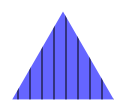

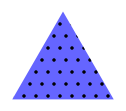

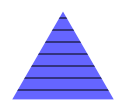

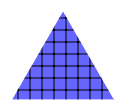

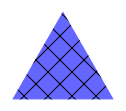

...

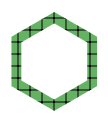

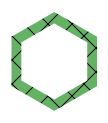

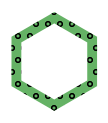

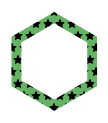

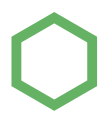

In [8]:
lables_0=[]
lables_1=[]
lables_2=[]
df = pd.DataFrame()


lable_0=0
lable_1=0
lable_2=0


images=True

if images:
    imgs=[]
    names = []

i = 0
for n in n_s:
    for scale in scale_s:
        for stretch in stretch_s:
            for fc in fc_s:
                for pattern in pattern_s:

                    # create images
                    if images:
                        # initilize canvas
                        fig, ax = plt.subplots(figsize=(figsize, figsize))

                        # plot polygon
                        if n=="round":
                            poly = Ellipse(xy=(0, 0), width=1, height=1*stretch, fc=fc,hatch=pattern,alpha=alpha, )
                            poly_2 = Ellipse(xy=(0, 0), width=scale, height=scale*stretch, fc='w')


                        else:

                            x,y=get_coords(n)
                            y=y*stretch
                            coords= np.c_[x,y]


                            poly = Polygon(coords, fc=fc,hatch=pattern,alpha=alpha)
                            poly_2 = Polygon(coords*scale,  fc='w')


                        ax.add_patch(poly)
                        ax.add_patch(poly_2)


                        # No axis
                        ax.axis('image')
                        ax.axis('off')
                        plt.show()


                        # tight_layout
                        fig.tight_layout()
                        fig.canvas.draw()


                        # # Save
                        img=get_img_from_fig(fig, dpi=dpi)
                        values = {'Shape' : n, 'Thickness' : scale, 'Color' : fc, 'Pattern' : pattern, 'image' : str(i) + '.jpeg'}
                        df = pd.concat([df, pd.DataFrame([values])], ignore_index = True)

                        i+=1
                        imgs.append(img)


                    # append the labels at different level
                    lables_0.append(lable_0)
                    lables_1.append(lable_1)
                    lables_2.append(lable_2)


            lable_2+=1
        lable_1+=1
    lable_0+=1

imgs=np.array(imgs)

In [10]:
df.to_csv('attributes_shapes.csv', index=False)

### save imgs

In [11]:
image_fold="dataShapes112"

In [12]:
if not os.path.exists(image_fold):
    os.makedirs(image_fold)

In [13]:
for i,img in enumerate(imgs):
    img = Image.fromarray(img)
    img.save(os.path.join(image_fold,str(i)+".jpeg"))

In [14]:
from PIL import Image
import os, sys
import cv2
import numpy as np

'''
Converts all images in a directory to '.npy' format.
Use np.save and np.load to save and load the images.
Use it for training your neural networks in ML/DL projects.
'''

# Path to image directory
path = "dataShapes112/"
dirs = os.listdir( path )
x_train=[]

def load_dataset():
    # Append images to a list
    for item in dirs:
        if os.path.isfile(path+item):
            im = mpimg.imread(path+item)
            im = np.array(im)
            x_train.append(im)

if __name__ == "__main__":

    load_dataset()

    # Convert and save the list of images in '.npy' format
    imgset=np.array(x_train)
    np.save("imgs112.npy",imgset)